## Bloque 1: SHELF COUNTER ZERO-SHOT

Este bloque se encarga de preparar el entorno. Instala las librerías necesarias, monta Google Drive para acceder a los archivos y define todas las variables de configuración importantes como rutas de imágenes, umbrales de detección y el modelo a utilizar.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# =========================
# SHELF COUNTER ZERO-SHOT
# =========================

import sys
import subprocess
import os
import json
from dataclasses import dataclass
from typing import List, Dict, Tuple

def pip_install(packages):
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q"] + packages)

def apt_install(packages):
    subprocess.check_call(["apt-get", "install", "-y", "-qq"] + packages)

pip_install([
    "torch",
    "torchvision",
    "transformers",
    "pillow",
    "numpy"
])

apt_install(["fonts-dejavu-core"])


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Bloque 2: CONFIGURACIÓN

El bloque de CONFIGURACIÓN define rutas de archivos, selecciona el modelo y el dispositivo de ejecución, y establece umbrales clave para la detección de objetos. También configura parámetros de filtrado como NMS, área mínima de caja y proporciones para los estantes, y las etiquetas textuales para las consultas de detección.

In [ ]:
# =========================
# CONFIGURACIÓN
# =========================
IMAGE_PATH = "/content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/Data/new_image.jpg"
OUTPUT_IMAGE = "/content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/Data/new_image_annotated_v3.png"
OUTPUT_JSON = "/content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/Data/new_image_counts_v3.json"

MODEL_ID = "IDEA-Research/grounding-dino-base"
DEVICE = "cuda" if __import__("torch").cuda.is_available() else "cpu"

# pasada global
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.30

# pasada extra para latas shelf 2
SECOND_SHELF_BOX_THRESHOLD = 0.25
SECOND_SHELF_TEXT_THRESHOLD = 0.20

# pasada extra para botellas shelf 3
BOTTLE_SHELF_BOX_THRESHOLD = 0.28
BOTTLE_SHELF_TEXT_THRESHOLD = 0.23

NMS_IOU = 0.35
MIN_BOX_AREA_RATIO = 0.0015
SHELF_GAP_RATIO = 0.10

TEXT_QUERIES = [
    "aluminum can",
    "plastic bottle",
]


# Bloque 3: IMPORTS
El bloque de IMPORTS carga librerías esenciales como numpy para operaciones numéricas y Pillow para manipulación de imágenes. También importa torch y torchvision para funcionalidades de aprendizaje profundo, y transformers para el modelo de detección de objetos de cero disparos.

In [ ]:
# =========================
# IMPORTS
# =========================
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import torch
from torchvision.ops import nms
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection


## Bloque 4 ESTRUCTURAS

El bloque de "ESTRUCTURAS" define la clase Detection. Esta clase organiza los datos de cada objeto detectado, incluyendo su etiqueta, puntuación de confianza y coordenadas de la caja delimitadora. También proporciona propiedades calculadas como el área y el centro para facilitar el procesamiento.

In [ ]:
# =========================
# ESTRUCTURAS
# =========================
@dataclass
class Detection:
    label: str
    score: float
    box: List[float]
    shelf_id: int = -1
    index: int = -1

    @property
    def x1(self): return self.box[0]
    @property
    def y1(self): return self.box[1]
    @property
    def x2(self): return self.box[2]
    @property
    def y2(self): return self.box[3]
    @property
    def w(self): return max(0.0, self.x2 - self.x1)
    @property
    def h(self): return max(0.0, self.y2 - self.y1)
    @property
    def area(self): return self.w * self.h
    @property
    def cx(self): return (self.x1 + self.x2) / 2.0
    @property
    def cy(self): return (self.y1 + self.y2) / 2.0



## Bloque 5: UTILIDADES

El bloque de UTILIDADES agrupa funciones esenciales para el filtrado y refinamiento de las detecciones, como la eliminación de cajas pequeñas y la supresión de detecciones duplicadas mediante NMS, además de filtrar entre distintas etiquetas.



In [ ]:
def load_image(image_path: str) -> Image.Image:
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"No se encontró la imagen: {image_path}")
    return Image.open(image_path).convert("RGB")

def get_font(size: int = 22):
    possible = [
        "/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf",
        "/usr/share/fonts/truetype/liberation2/LiberationSans-Bold.ttf",
    ]
    for p in possible:
        if os.path.exists(p):
            return ImageFont.truetype(p, size=size)
    return ImageFont.load_default()

def normalize_label(raw_label: str) -> str:
    label = str(raw_label).strip().lower()
    if "can" in label or "aluminum" in label:
        return "can"
    if "bottle" in label:
        return "bottle"
    return label

def clamp_box(box: List[float], width: int, height: int) -> List[float]:
    x1, y1, x2, y2 = box
    x1 = max(0, min(width - 1, x1))
    y1 = max(0, min(height - 1, y1))
    x2 = max(0, min(width - 1, x2))
    y2 = max(0, min(height - 1, y2))
    if x2 < x1:
        x1, x2 = x2, x1
    if y2 < y1:
        y1, y2 = y2, y1
    return [float(x1), float(y1), float(x2), float(y2)]

def draw_label(draw, x, y, text, font):
    bbox = draw.textbbox((x, y), text, font=font)
    pad_x = 10
    pad_y = 6
    draw.rectangle(
        [bbox[0] - pad_x, bbox[1] - pad_y, bbox[2] + pad_x, bbox[3] + pad_y],
        fill=BLACK
    )
    draw.text((x, y), text, fill=WHITE, font=font)

def compute_iou(box_a, box_b):
    xa1, ya1, xa2, ya2 = box_a
    xb1, yb1, xb2, yb2 = box_b
    inter_x1 = max(xa1, xb1)
    inter_y1 = max(ya1, yb1)
    inter_x2 = min(xa2, xb2)
    inter_y2 = min(ya2, yb2)

    inter_w = max(0.0, inter_x2 - inter_x1)
    inter_h = max(0.0, inter_y2 - inter_y1)
    inter = inter_w * inter_h

    area_a = max(0.0, xa2 - xa1) * max(0.0, ya2 - ya1)
    area_b = max(0.0, xb2 - xb1) * max(0.0, yb2 - yb1)
    union = area_a + area_b - inter + 1e-6
    return inter / union

def box_center_inside_y(box, y1, y2):
    cy = (box[1] + box[3]) / 2.0
    return y1 <= cy <= y2


## Bloque 6: MODELO

El bloque de MODELO se encarga de cargar el procesador y el modelo de detección de objetos pre-entrenado, identificando 'grounding-dino-base'. Inicializa el modelo en el dispositivo configurado (GPU o CPU) y lo prepara para realizar inferencias. Este paso es fundamental para poder detectar objetos en las imágenes.

In [ ]:
# =========================
# MODELO
# =========================
print("[INFO] Cargando processor/model...")
processor = AutoProcessor.from_pretrained(MODEL_ID)
model = AutoModelForZeroShotObjectDetection.from_pretrained(MODEL_ID).to(DEVICE)
model.eval()


[INFO] Cargando processor/model...


Loading weights:   0%|          | 0/1206 [00:00<?, ?it/s]

GroundingDinoForObjectDetection(
  (model): GroundingDinoModel(
    (backbone): GroundingDinoConvModel(
      (conv_encoder): GroundingDinoConvEncoder(
        (model): SwinBackbone(
          (embeddings): SwinEmbeddings(
            (patch_embeddings): SwinPatchEmbeddings(
              (projection): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
            )
            (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (encoder): SwinEncoder(
            (layers): ModuleList(
              (0): SwinStage(
                (blocks): ModuleList(
                  (0): SwinLayer(
                    (layernorm_before): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
                    (attention): SwinAttention(
                      (self): SwinSelfAttention(
                        (query): Linear(in_features=128, out_features=128, bias=True)
                        (key): Linear(in_featu

## Bloque 7: DETECCIÓN

El bloque de DETECCIÓN define la función principal detect_objects, que utiliza el modelo para identificar objetos en la imagen basándose en consultas de texto. Además, contiene funciones clave de filtrado como NMS y eliminación de cajas pequeñas. Estas utilidades refinan las detecciones iniciales para mejorar la precisión y eliminar duplicados.


In [ ]:
# =========================
# DETECCIÓN
# =========================
def detect_objects(image: Image.Image, threshold: float, text_threshold: float, queries=None) -> List[Detection]:
    if queries is None:
        queries = TEXT_QUERIES

    text_prompt = ". ".join(queries) + "."
    inputs = processor(images=image, text=text_prompt, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    width, height = image.size
    results = processor.post_process_grounded_object_detection(
        outputs,
        inputs.input_ids,
        threshold=threshold,
        text_threshold=text_threshold,
        target_sizes=[(height, width)],
    )[0]

    boxes = results.get("boxes", [])
    scores = results.get("scores", [])
    labels = results.get("text_labels", results.get("labels", []))

    detections = []
    for box, score, label in zip(boxes, scores, labels):
        box_list = clamp_box([float(v) for v in box.tolist()], width, height)
        detections.append(
            Detection(
                label=normalize_label(label),
                score=float(score),
                box=box_list,
            )
        )
    return detections



## Bloque 8: FILTOS

El bloque de FILTROS refina las detecciones de objetos aplicando varias técnicas. Elimina cajas pequeñas y duplicadas con NMS, y gestiona superposiciones entre diferentes etiquetas. Además, permite filtrar detecciones por bandas específicas de estantes.

Este conjunto de funcionesse utilizan para mejorar la calidad de las detecciones:
*   `filter_small_boxes`: Elimina cajas muy pequeñas que probablemente son ruido.
*   `classwise_nms`: Aplica Non-Maximum Suppression (NMS) para eliminar detecciones duplicadas de la misma clase.
*   `cross_label_duplicate_filter`: Filtra duplicados que pueden surgir de diferentes etiquetas (e.g., una caja detectada como 'can' y 'bottle' en el mismo lugar).
*   `filter_by_shelf_band`: Filtra detecciones dentro de una banda vertical específica de la imagen.

In [ ]:
# =========================
# FILTROS
# =========================
def filter_small_boxes(detections: List[Detection], image_size: Tuple[int, int], min_box_area_ratio: float):
    width, height = image_size
    min_area = width * height * min_box_area_ratio
    return [d for d in detections if d.area >= min_area and d.w > 10 and d.h > 18]

def classwise_nms(detections: List[Detection], iou_threshold: float):
    if not detections:
        return []

    grouped = {}
    for det in detections:
        grouped.setdefault(det.label, []).append(det)

    kept = []
    for _, items in grouped.items():
        boxes = torch.tensor([d.box for d in items], dtype=torch.float32)
        scores = torch.tensor([d.score for d in items], dtype=torch.float32)
        keep_idx = nms(boxes, scores, iou_threshold)
        for idx in keep_idx.tolist():
            kept.append(items[idx])
    return kept

def cross_label_duplicate_filter(detections: List[Detection], iou_threshold: float = 0.65):
    if len(detections) <= 1:
        return detections

    detections = sorted(detections, key=lambda d: d.score, reverse=True)
    selected = []

    for det in detections:
        duplicated = False
        for s in selected:
            if compute_iou(det.box, s.box) > iou_threshold:
                duplicated = True
                break
        if not duplicated:
            selected.append(det)
    return selected

def filter_by_shelf_band(detections, band_y1, band_y2, allowed_labels=None):
    out = []
    for d in detections:
        if box_center_inside_y(d.box, band_y1, band_y2):
            if allowed_labels is None or d.label in allowed_labels:
                out.append(d)
    return out



## Bloque 9: AGRUPACIÓN POR SHELF

El bloque 'AGRUPACIÓN POR SHELF' se encarga de organizar las detecciones en estantes lógicos. Primero, asigna cada objeto detectado a un estante (assign_shelves), y luego estima las bandas verticales que ocupa cada estante en la imagen (estimate_shelf_bands). Esto permite estructurar el conteo por ubicación dentro de la estantería.

In [ ]:
# =========================
# AGRUPACIÓN POR SHELF
# =========================
def assign_shelves(detections: List[Detection], image_height: int, shelf_gap_ratio: float):
    if not detections:
        return detections

    gap = image_height * shelf_gap_ratio
    detections_sorted = sorted(detections, key=lambda d: d.cy)

    shelf_centers = []
    shelf_members = []

    for det in detections_sorted:
        placed = False
        for shelf_id, center_y in enumerate(shelf_centers):
            if abs(det.cy - center_y) <= gap:
                shelf_members[shelf_id].append(det)
                shelf_centers[shelf_id] = float(np.mean([d.cy for d in shelf_members[shelf_id]]))
                placed = True
                break
        if not placed:
            shelf_centers.append(det.cy)
            shelf_members.append([det])

    indexed_shelves = list(enumerate(shelf_members))
    indexed_shelves.sort(key=lambda x: np.mean([d.cy for d in x[1]]))

    final = []
    for new_shelf_id, (_, members) in enumerate(indexed_shelves, start=1):
        members.sort(key=lambda d: d.cx)
        for det in members:
            det.shelf_id = new_shelf_id
            final.append(det)
    return final

def estimate_shelf_bands(detections, image_h):
    assigned = assign_shelves(detections, image_h, SHELF_GAP_RATIO)
    shelf_groups = {}
    for d in assigned:
        shelf_groups.setdefault(d.shelf_id, []).append(d)

    bands = {}
    for sid, items in shelf_groups.items():
        y1 = min(d.y1 for d in items)
        y2 = max(d.y2 for d in items)
        pad = int((y2 - y1) * 0.22)
        bands[sid] = (max(0, int(y1 - pad)), min(image_h, int(y2 + pad)))
    return bands




## Bloque 10: PASADAS EXTRA

El bloque de 'PASADAS EXTRA' contiene funciones para realizar detecciones adicionales en estantes específicos con umbrales más permisivos. Por ejemplo, detect_second_shelf_extra se enfoca en el segundo estante para latas, y detect_bottle_shelf_extra en el tercer estante para botellas, usando recortes de la imagen original.

In [ ]:
# =========================
# PASADAS EXTRA
# =========================
def detect_second_shelf_extra(full_image: Image.Image, bands: Dict[int, Tuple[int, int]]) -> List[Detection]:
    if 2 not in bands:
        return []

    band_y1, band_y2 = bands[2]
    crop = full_image.crop((0, band_y1, full_image.size[0], band_y2))

    extra = detect_objects(
        crop,
        threshold=SECOND_SHELF_BOX_THRESHOLD,
        text_threshold=SECOND_SHELF_TEXT_THRESHOLD,
        queries=["aluminum can"]
    )

    shifted = []
    for d in extra:
        shifted.append(
            Detection(
                label=d.label,
                score=d.score,
                box=[d.x1, d.y1 + band_y1, d.x2, d.y2 + band_y1]
            )
        )

    shifted = filter_by_shelf_band(shifted, band_y1, band_y2, allowed_labels=["can"])
    return shifted

def detect_bottle_shelf_extra(full_image: Image.Image, bands: Dict[int, Tuple[int, int]]) -> List[Detection]:
    if 3 not in bands:
        return []

    band_y1, band_y2 = bands[3]
    crop = full_image.crop((0, band_y1, full_image.size[0], band_y2))

    extra = detect_objects(
        crop,
        threshold=BOTTLE_SHELF_BOX_THRESHOLD,
        text_threshold=BOTTLE_SHELF_TEXT_THRESHOLD,
        queries=["plastic bottle"]
    )

    shifted = []
    for d in extra:
        shifted.append(
            Detection(
                label=d.label,
                score=d.score,
                box=[d.x1, d.y1 + band_y1, d.x2, d.y2 + band_y1]
            )
        )

    shifted = filter_by_shelf_band(shifted, band_y1, band_y2, allowed_labels=["bottle"])
    return shifted


## Bloque 11: CONTEO

El bloque de CONTEO se encarga de consolidar todas las detecciones finales para generar un resumen cuantitativo. Agrupa los objetos por estante, contando latas y botellas de manera individual y total. Finalmente, produce un diccionario que detalla estos conteos por estante y un gran total general de todos los objetos.

In [ ]:
# =========================
# CONTEO
# =========================
def build_counts(detections: List[Detection]) -> Dict:
    shelves = {}
    total_cans = 0
    total_bottles = 0

    for det in detections:
        shelves.setdefault(det.shelf_id, {"cans": 0, "bottles": 0, "total": 0})
        if det.label == "can":
            shelves[det.shelf_id]["cans"] += 1
            total_cans += 1
        elif det.label == "bottle":
            shelves[det.shelf_id]["bottles"] += 1
            total_bottles += 1
        shelves[det.shelf_id]["total"] += 1

    return {
        "shelves": {f"shelf_{k}": v for k, v in sorted(shelves.items(), key=lambda x: x[0])},
        "total": {
            "cans": total_cans,
            "bottles": total_bottles,
            "objects": total_cans + total_bottles,
        }
    }


## Bloque 12: ANOTACIÓN

La función annotate_image crea una nueva imagen con las detecciones visualizadas. Dibuja las cajas delimitadoras, los números de índice de cada detección, y añade un resumen de los conteos totales en la parte superior e inferior de la imagen.

In [ ]:
# =========================
# ANOTACIÓN
# =========================
def annotate_image(image: Image.Image, detections: List[Detection], counts: Dict) -> Image.Image:
    annotated = image.copy()
    draw = ImageDraw.Draw(annotated)
    width, height = annotated.size

    line_width = max(3, int(round(min(width, height) * 0.0035)))

    # NÚMEROS MÁS GRANDES
    font_small = get_font(size=max(24, int(height * 0.010)))
    font_big = get_font(size=max(28, int(height * 0.010)))

    detections = sorted(detections, key=lambda d: (d.shelf_id, d.cx))

    for idx, det in enumerate(detections, start=1):
        det.index = idx
        x1, y1, x2, y2 = det.box
        draw.rectangle([x1, y1, x2, y2], outline=SKY_BLUE, width=line_width)

        label_y = max(4, y1 - 40)
        draw_label(draw, x1 + 6, label_y, str(idx), font_small)

    total_text = f"TOTAL COUNT: {counts['total']['objects']}"
    tb = draw.textbbox((0, 0), total_text, font=font_big)
    tx = (width - (tb[2] - tb[0])) / 2
    ty = max(10, int(height * 0.025))
    draw_label(draw, tx, ty, total_text, font_big)

    summary = f"Cans: {counts['total']['cans']} | Bottles: {counts['total']['bottles']}"
    sb = draw.textbbox((0, 0), summary, font=font_small)
    sx = width - (sb[2] - sb[0]) - 16
    sy = height - 50
    draw_label(draw, sx, sy, summary, font_small)

    return annotated

## Bloque 13: PIPELINE

La función run_pipeline orquesta todo el proceso: carga la imagen, realiza la detección inicial, aplica los filtros, estima estantes, ejecuta las pasadas extra, fusiona los resultados, construye los conteos, anota la imagen y guarda tanto la imagen anotada como un archivo JSON con todos los detalles de las detecciones y conteos.

In [ ]:
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import torch
from torchvision.ops import nms
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection

# =========================
# PIPELINE
# =========================
def run_pipeline():
    print(f"[INFO] IMAGE_PATH: {IMAGE_PATH}")
    print(f"[INFO] DEVICE: {DEVICE}")

    image = load_image(IMAGE_PATH)
    width, height = image.size
    print(f"[INFO] Tamaño imagen: {width}x{height}")

    # 1) Detección global
    detections_global = detect_objects(
        image=image,
        threshold=BOX_THRESHOLD,
        text_threshold=TEXT_THRESHOLD,
        queries=TEXT_QUERIES
    )
    print(f"[INFO] Global crudas: {len(detections_global)}")

    detections_global = filter_small_boxes(detections_global, (width, height), MIN_BOX_AREA_RATIO)
    detections_global = classwise_nms(detections_global, NMS_IOU)
    detections_global = cross_label_duplicate_filter(detections_global, 0.55)
    print(f"[INFO] Global filtradas: {len(detections_global)}")

    # 2) Estimar bandas de shelves
    bands = estimate_shelf_bands(detections_global, height)
    print(f"[INFO] Bandas estimadas: {bands}")

    # 3) Pasada extra para latas shelf 2
    detections_second = detect_second_shelf_extra(image, bands)
    detections_second = filter_small_boxes(detections_second, (width, height), MIN_BOX_AREA_RATIO * 0.70)
    detections_second = classwise_nms(detections_second, 0.35)
    detections_second = cross_label_duplicate_filter(detections_second, 0.50)
    print(f"[INFO] Extra shelf 2: {len(detections_second)}")

    # 4) Pasada extra para botellas shelf 3
    detections_bottle = detect_bottle_shelf_extra(image, bands)
    detections_bottle = filter_small_boxes(detections_bottle, (width, height), MIN_BOX_AREA_RATIO * 0.60)
    detections_bottle = classwise_nms(detections_bottle, 0.35)
    detections_bottle = cross_label_duplicate_filter(detections_bottle, 0.50)
    print(f"[INFO] Extra shelf 3 botellas: {len(detections_bottle)}")

    # 5) Fusionar
    merged = detections_global + detections_second + detections_bottle
    merged = classwise_nms(merged, 0.38)
    merged = cross_label_duplicate_filter(merged, 0.50)

    merged = assign_shelves(merged, height, SHELF_GAP_RATIO)
    counts = build_counts(merged)

    annotated = annotate_image(image, merged, counts)

    os.makedirs(os.path.dirname(OUTPUT_IMAGE), exist_ok=True)
    os.makedirs(os.path.dirname(OUTPUT_JSON), exist_ok=True)

    annotated.save(OUTPUT_IMAGE)

    payload = {
        "image": IMAGE_PATH,
        "output_image": OUTPUT_IMAGE,
        "output_json": OUTPUT_JSON,
        "parameters": {
            "box_threshold": BOX_THRESHOLD,
            "text_threshold": TEXT_THRESHOLD,
            "second_shelf_box_threshold": SECOND_SHELF_BOX_THRESHOLD,
            "second_shelf_text_threshold": SECOND_SHELF_TEXT_THRESHOLD,
            "bottle_shelf_box_threshold": BOTTLE_SHELF_BOX_THRESHOLD,
            "bottle_shelf_text_threshold": BOTTLE_SHELF_TEXT_THRESHOLD,
            "nms_iou": NMS_IOU,
            "min_box_area_ratio": MIN_BOX_AREA_RATIO,
            "shelf_gap_ratio": SHELF_GAP_RATIO,
            "device": DEVICE,
        },
        "counts": counts,
        "detections": [
            {
                "index": det.index,
                "label": det.label,
                "score": round(det.score, 4),
                "shelf_id": det.shelf_id,
                "box_xyxy": [round(v, 2) for v in det.box]
            }
            for det in sorted(merged, key=lambda d: d.index)
        ]
    }

    with open(OUTPUT_JSON, "w", encoding="utf-8") as f:
        json.dump(payload, f, ensure_ascii=False, indent=2)

    print("\n[RESULTADO]")
    print(json.dumps(counts, ensure_ascii=False, indent=2))
    print(f"\nImagen guardada en:\n{OUTPUT_IMAGE}")
    print(f"\nJSON guardado en:\n{OUTPUT_JSON}")

    return payload

## Bloque 14: Mostrar Resultado

Finalmente, este bloque ejecuta la función run_pipeline para procesar la imagen y obtener los resultados. Luego, utiliza IPython.display para mostrar la imagen anotada directamente en el notebook, permitiendo visualizar el conteo de objetos. Es el punto final de la ejecución del programa.

[INFO] IMAGE_PATH: /content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/Data/new_image.jpg
[INFO] DEVICE: cpu
[INFO] Tamaño imagen: 4032x6048


/usr/local/lib/python3.12/dist-packages/transformers/models/grounding_dino/processing_grounding_dino.py:96: FutureWarning: The key `labels` is will return integer ids in `GroundingDinoProcessor.post_process_grounded_object_detection` output since v4.51.0. Use `text_labels` instead to retrieve string object names.
  warnings.warn(self.message, FutureWarning)


[INFO] Global crudas: 20
[INFO] Global filtradas: 20
[INFO] Bandas estimadas: {1: (144, 1548), 2: (2236, 3842), 3: (3704, 5742), 4: (5465, 6048)}
[INFO] Extra shelf 2: 20
[INFO] Extra shelf 3 botellas: 20

[RESULTADO]
{
  "shelves": {
    "shelf_1": {
      "cans": 7,
      "bottles": 0,
      "total": 7
    },
    "shelf_2": {
      "cans": 20,
      "bottles": 0,
      "total": 20
    },
    "shelf_3": {
      "cans": 0,
      "bottles": 16,
      "total": 16
    },
    "shelf_4": {
      "cans": 0,
      "bottles": 6,
      "total": 6
    }
  },
  "total": {
    "cans": 27,
    "bottles": 22,
    "objects": 49
  }
}

Imagen guardada en:
/content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/Data/new_image_annotated_v3.png

JSON guardado en:
/content/drive/MyDrive/Colab Notebooks/MNA/Proyecto Integrador/Data/new_image_counts_v3.json


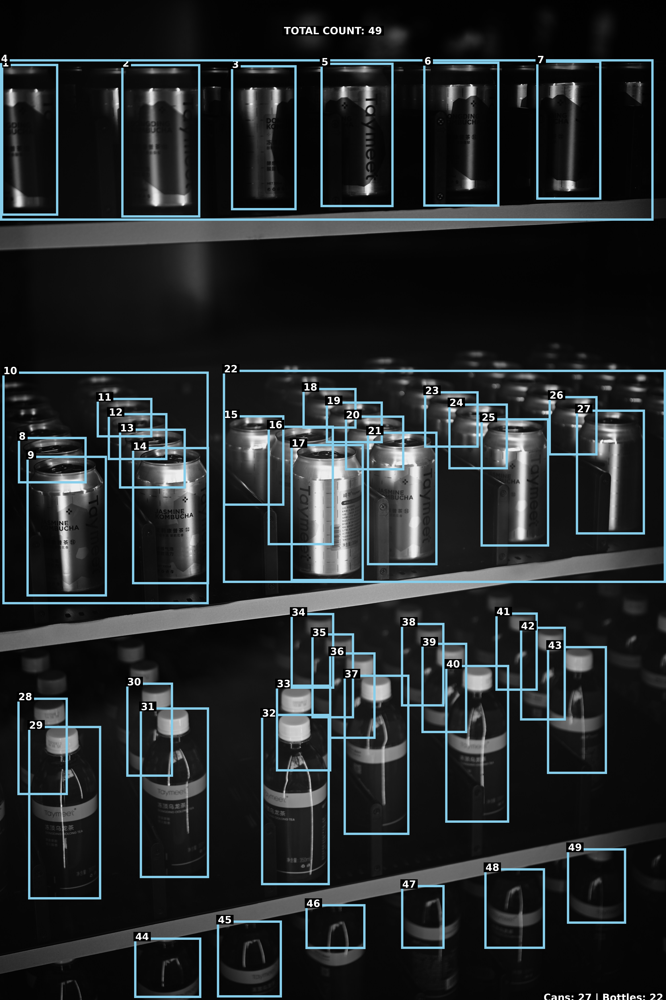

In [ ]:
result = run_pipeline()

from IPython.display import display
display(Image.open(OUTPUT_IMAGE))